In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download  farzadnekouei/pothole-image-segmentation-dataset

Dataset URL: https://www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset
License(s): Apache 2.0
 98% 58.0M/59.3M [00:03<00:00, 23.5MB/s]
100% 59.3M/59.3M [00:03<00:00, 16.6MB/s]


In [ ]:
!unzip pothole-image-segmentation-dataset.zip

Archive:  pothole-image-segmentation-dataset.zip
  inflating: Pothole_Segmentation_YOLOv8/README.dataset.txt  
  inflating: Pothole_Segmentation_YOLOv8/README.roboflow.txt  
  inflating: Pothole_Segmentation_YOLOv8/data.yaml  
  inflating: Pothole_Segmentation_YOLOv8/sample_video.mp4  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.49882cdb272111f43a6656b1494a4918.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.8d95dd1d29760a2634a45cc7fdd84b31.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.e238c9bf3fe82e8ac55b0014a27fc529.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.1d433d21e11d000b6b498eacb88fe4a9.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.500c683a687e403f4cdade4826a84b5b.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.5a901c212d899a7dc7dc78be7de892c0.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-100-_jpg.r

In [ ]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 799.6/799.6 kB 8.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from ultralytics import YOLO
import cv2
from PIL import Image
import yaml
import random

Plot the Image

In [ ]:
dataDir = '/content/Pothole_Segmentation_YOLOv8/'


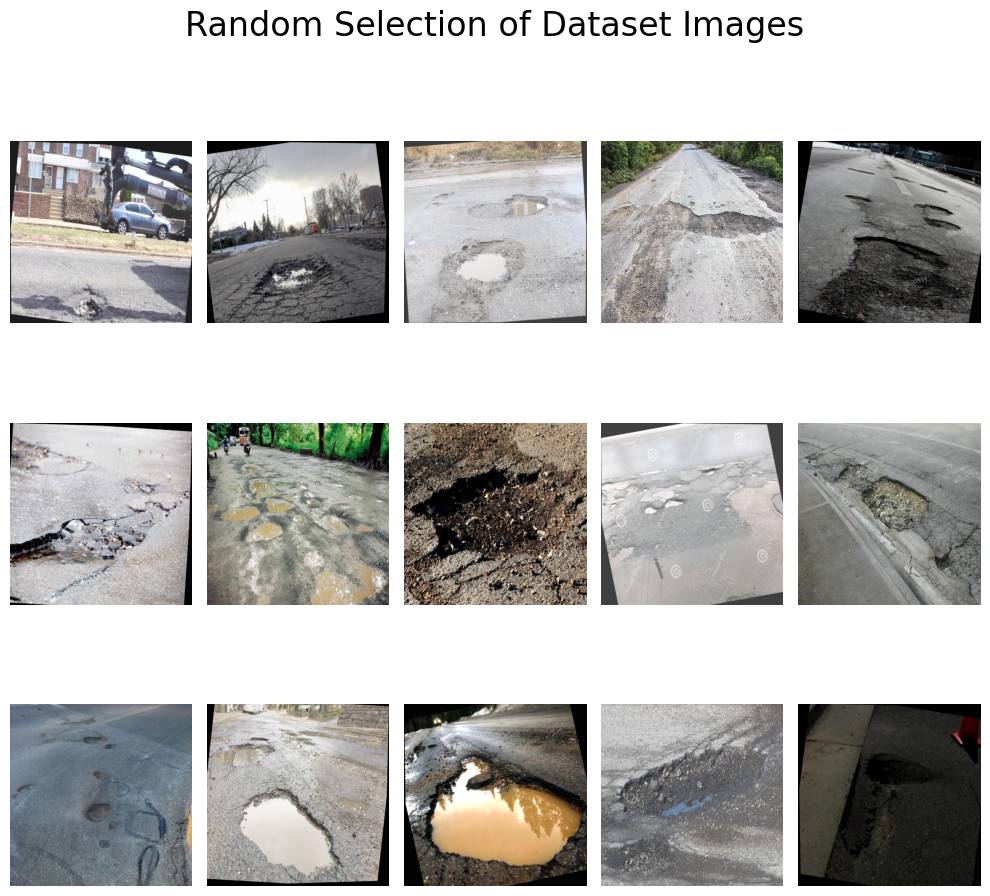

In [ ]:
trainImagePath = os.path.join(dataDir, 'train','images')

#list of the images
imageFiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]

randomImages = random.sample(imageFiles, 15)

plt.figure(figsize=(10, 10))

for i, image_file in enumerate(randomImages):

    image_path = os.path.join(trainImagePath, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

  # Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

Download & Train The Yolov8 Segmentation Model


In [ ]:
model = YOLO('yolov8n-seg.pt')


100%|██████████| 6.74M/6.74M [00:00<00:00, 180MB/s]


In [ ]:
yamlFilePath = os.path.join(dataDir,'data.yaml' )


In [ ]:
results = model.train(
    data= yamlFilePath,
    epochs=30,
    imgsz=640,
    batch=32,
    optimizer='auto',
    lr0=0.0001,              # Initial learning rate
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device=0,                # Device to run on, i.e. cuda device=0
    seed=42
)

Ultralytics YOLOv8.2.51 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/Pothole_Segmentation_YOLOv8/data.yaml, epochs=30, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tru

100%|██████████| 755k/755k [00:00<00:00, 90.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 289MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:01<00:00, 520.02it/s]

train: New cache created: /content/Pothole_Segmentation_YOLOv8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 363.21it/s]

val: New cache created: /content/Pothole_Segmentation_YOLOv8/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.16G      1.509      3.302       2.61      1.454         65        640: 100%|██████████| 23/23 [00:25<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

                   all         60        201      0.183      0.413      0.249      0.128      0.219      0.343      0.216      0.107



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      5.41G      1.407       2.38      1.807      1.361         68        640: 100%|██████████| 23/23 [00:19<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.303      0.184      0.157     0.0757      0.332      0.144      0.115     0.0443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30       5.4G      1.412       2.36      1.735      1.387         61        640: 100%|██████████| 23/23 [00:17<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         60        201       0.29      0.154      0.109     0.0375      0.266      0.129     0.0913     0.0303



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.41G      1.415       2.31      1.585       1.38         54        640: 100%|██████████| 23/23 [00:17<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]

                   all         60        201      0.288      0.373      0.243      0.113      0.287      0.284      0.213      0.083



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.43G      1.428      2.335      1.531      1.365         84        640: 100%|██████████| 23/23 [00:17<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all         60        201      0.192      0.189      0.106     0.0388      0.204      0.199       0.11     0.0412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      5.41G       1.43      2.269      1.466      1.389         76        640: 100%|██████████| 23/23 [00:17<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         60        201       0.42      0.303      0.294      0.142      0.377      0.265      0.253      0.129



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.41G      1.384      2.246      1.422      1.375         74        640: 100%|██████████| 23/23 [00:18<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all         60        201      0.542      0.393      0.412       0.21      0.534      0.383      0.376      0.182



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.43G      1.347      2.131      1.333       1.32         65        640: 100%|██████████| 23/23 [00:17<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         60        201      0.496      0.455      0.448      0.232      0.509      0.408      0.419      0.205



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.39G      1.335      2.165      1.306      1.321         61        640: 100%|██████████| 23/23 [00:18<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all         60        201      0.487      0.473      0.417      0.196      0.508      0.431      0.403      0.192



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.44G      1.314      2.099      1.216      1.293         71        640: 100%|██████████| 23/23 [00:18<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.99s/it]

                   all         60        201      0.617      0.572      0.538      0.304      0.629      0.582      0.559      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.33G       1.31      2.124      1.181      1.296         55        640: 100%|██████████| 23/23 [00:17<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]

                   all         60        201      0.463      0.423      0.412      0.206      0.429      0.398      0.393      0.185



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30       5.6G      1.258      2.024      1.117      1.243         65        640: 100%|██████████| 23/23 [00:16<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]

                   all         60        201      0.514      0.522      0.465      0.261      0.522      0.517      0.465      0.242



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.49G      1.225      1.988      1.082      1.237         93        640: 100%|██████████| 23/23 [00:17<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]

                   all         60        201       0.63      0.582      0.576      0.322      0.621      0.588      0.592      0.304



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      5.39G      1.202      1.959      1.054      1.224         79        640: 100%|██████████| 23/23 [00:17<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.672      0.509      0.581      0.327      0.695      0.517      0.594      0.308



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.51G      1.187      1.915      1.016      1.231         75        640: 100%|██████████| 23/23 [00:18<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

                   all         60        201      0.633      0.602      0.591      0.339      0.649      0.618      0.617      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.56G      1.128      1.815     0.9446      1.174         65        640: 100%|██████████| 23/23 [00:17<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all         60        201      0.679      0.667      0.669      0.375      0.696      0.677      0.667      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.36G      1.161      1.848     0.9549       1.19         66        640: 100%|██████████| 23/23 [00:18<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.668      0.601      0.616      0.361      0.692      0.617       0.63      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.37G      1.142       1.82     0.9717       1.19         76        640: 100%|██████████| 23/23 [00:18<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

                   all         60        201       0.73      0.592      0.663      0.385      0.736      0.597      0.661      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.39G      1.125      1.776     0.9154      1.184         90        640: 100%|██████████| 23/23 [00:17<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]

                   all         60        201      0.612      0.647      0.642      0.374      0.603      0.637      0.637      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.41G      1.089      1.751     0.8772       1.16         54        640: 100%|██████████| 23/23 [00:16<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]

                   all         60        201      0.645       0.58      0.643      0.373      0.645       0.58      0.652      0.358


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.47G      1.095      1.722     0.8588      1.162         38        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

                   all         60        201      0.566      0.582      0.549      0.283      0.557      0.572      0.524      0.268



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.38G      1.084      1.708     0.8365      1.171         29        640: 100%|██████████| 23/23 [00:16<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all         60        201      0.685      0.681        0.7      0.391      0.671      0.672      0.696      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.34G      1.028      1.607     0.7466      1.139         34        640: 100%|██████████| 23/23 [00:17<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

                   all         60        201      0.716      0.662      0.708      0.413      0.727      0.672      0.718      0.396



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.31G      1.003      1.571     0.7145      1.108         29        640: 100%|██████████| 23/23 [00:16<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all         60        201      0.714      0.672      0.679       0.41      0.719      0.673      0.676      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.35G     0.9733      1.573     0.6956      1.089         41        640: 100%|██████████| 23/23 [00:16<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

                   all         60        201      0.683      0.697       0.69      0.421      0.685      0.702      0.706      0.408



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.36G     0.9687      1.538      0.671       1.09         35        640: 100%|██████████| 23/23 [00:16<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all         60        201       0.69      0.685      0.693      0.432      0.705        0.7      0.712      0.418



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.31G      0.928      1.484     0.6404      1.069         37        640: 100%|██████████| 23/23 [00:15<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]

                   all         60        201       0.67      0.706      0.709      0.438      0.654      0.721       0.71      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.32G     0.8982      1.457     0.6171      1.047         24        640: 100%|██████████| 23/23 [00:16<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all         60        201      0.786      0.622      0.731      0.442      0.793      0.627      0.734      0.434



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.32G     0.9022      1.465     0.5999      1.053         46        640: 100%|██████████| 23/23 [00:16<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all         60        201      0.727      0.657      0.732      0.444      0.721      0.672      0.731      0.435



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.32G     0.8636      1.413     0.5999      1.034         39        640: 100%|██████████| 23/23 [00:15<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all         60        201      0.715      0.677      0.728      0.447      0.726      0.687      0.732      0.433



30 epochs completed in 0.176 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.2.51 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


                   all         60        201      0.728      0.657      0.732      0.444      0.722      0.672      0.731      0.435
Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/segment/train


In [ ]:
bestModelpath = '/content/runs/segment/train/weights/best.pt'
bestModel = YOLO(bestModelpath)

Make The Inferences on Images



image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-123-_jpg.rf.385ae3fbcdabda81f72ddf11f6a4b93d.jpg: 640x640 2 Potholes, 16.2ms
Speed: 2.0ms preprocess, 16.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-116-_jpg.rf.ddcb9d0e0bcf2a1a5096c4f04e6b7f9e.jpg: 640x640 11 Potholes, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 6.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-173-_jpg.rf.73512294c1b7b5c500eac27a0fb669f7.jpg: 640x640 1 Pothole, 19.7ms
Speed: 1.8ms preprocess, 19.7ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-257-_jpg.rf.09cb9983a70f1bd7ba096c252b64f909.jpg: 640x640 1 Pothole, 22.9ms
Speed: 1.9ms preprocess, 22.9ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLO

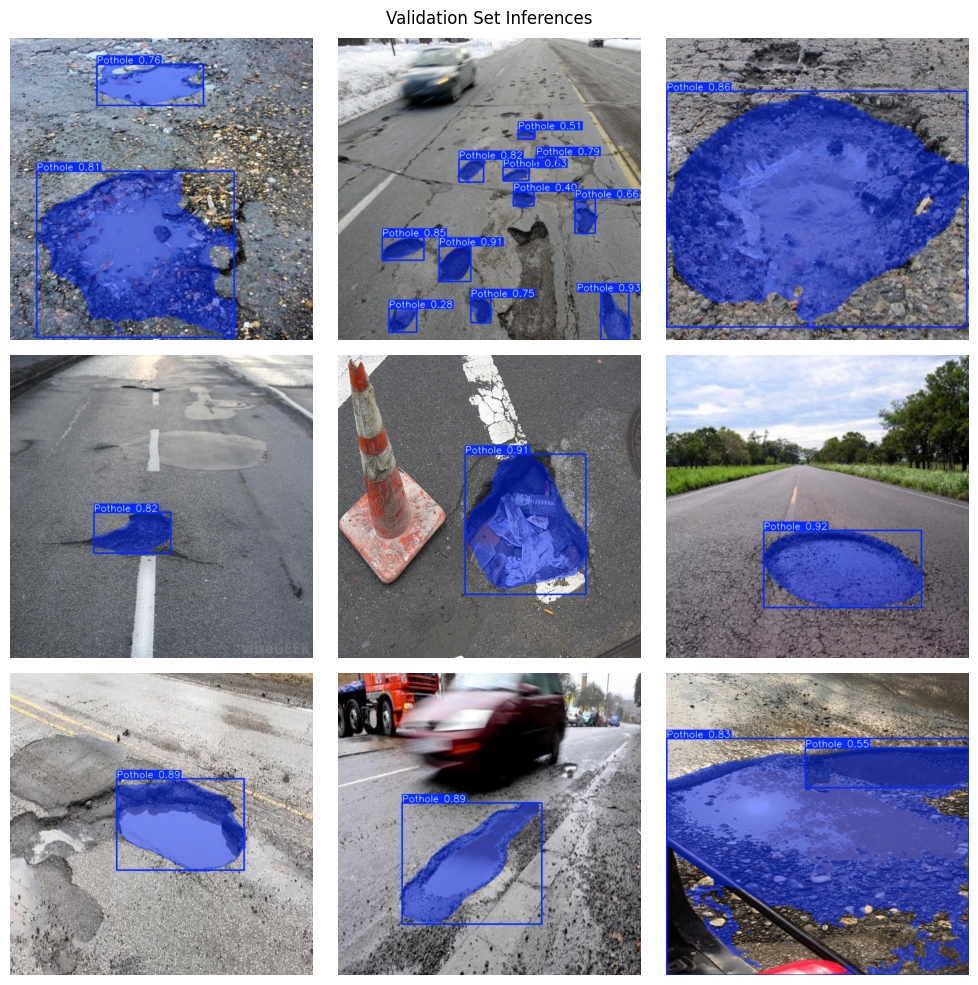

In [ ]:
validImagePath = os.path.join(dataDir, 'valid', 'images')

imageFiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]

#select Random images
numImages = len(imageFiles)
selectedImage = [imageFiles[i] for i in range(0, numImages, numImages // 9)]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle('Validation Set Inferences')

for i, ax in enumerate(axes.flatten()):
  imagePath = os.path.join(validImagePath, selectedImage[i])
  results = bestModel.predict(source= imagePath, imgsz=640)
  annotatedImage = results[0].plot()
  annotatedImageRGB = cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
  ax.imshow(annotatedImageRGB)
  ax.axis('off')

plt.tight_layout()
plt.show()

Make the Inference on video


In [ ]:
import shutil
videoPath = '/content/Pothole_Segmentation_YOLOv8/sample_video.mp4'

bestModel.predict(source=videoPath, save=True)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 163.3ms
video 1/1 (frame 2/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 12.9ms
video 1/1 (frame 3/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 13.9ms


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(


video 1/1 (frame 4/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 4 Potholes, 16.3ms
video 1/1 (frame 5/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 4 Potholes, 13.9ms
video 1/1 (frame 6/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 26.3ms
video 1/1 (frame 7/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 18.3ms
video 1/1 (frame 8/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 4 Potholes, 23.9ms
video 1/1 (frame 9/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 5 Potholes, 17.5ms
video 1/1 (frame 10/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 4 Potholes, 16.7ms
video 1/1 (frame 11/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 16.1ms
video 1/1 (frame 12/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 4 Potholes, 17.7ms
video 1/1 (frame 13/375) /content/Pothole_S

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

In [ ]:
import subprocess

# Convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/content/runs/segment/predict/sample_video.avi', 'output_video.mp4'])

from IPython.display import Video

# Display the converted MP4 video
Video("output_video.mp4", embed=True, width=960)